## Task 1: MLE computation

As you know, we can think about linear regression from the optimization point of view (as the problem of minimizing the root mean squared error), but we can also consider it from the probabilistic point of view.
Let's consider the following equation:

\begin{equation*}
y_i=x_i B_0+\varepsilon_i
\end{equation*}

where $y_i$ is the dependent variable, $x_i$ is a $1 \times K$ vector of regressors, $\beta_0$ is the $K \times 1$ vector of regression coefficients to be estimated and $\varepsilon_i$ is an unobservable error term.

The sample is made up of $N$ IID observations $\left(y_i, x_i\right)$.
The regression equations can be also written as

\begin{equation*}
y=X \beta_0+\varepsilon
\end{equation*}

where the $N \times 1$ vector of observations of the dependent variable is denoted by $y$, the $N \times K$ matrix of regressors is denoted by $X$, and the $N \times 1$ vector of error terms is denoted by $\varepsilon$.

As everybody interested in probability theory knows, we always have to have some assumptions. In this case, we assume that the vector of errors $\varepsilon$ has a multivariate normal distribution conditional on $x$, with mean equal to 0 and covariance matrix equal to

\begin{equation*}
\sigma_0^2 I
\end{equation*}

where $l$ is the $N \times N$ identity matrix and

\begin{equation*}
\sigma_0^2=\operatorname{Var}\left[\varepsilon_i \mid X\right]
\end{equation*}

is the second parameter to be estimated.
Furthermore, it is assumed that the matrix of regressors $x$ has full-rank.

Those assumptions have interesting implications:
- the covariance matrix of $\varepsilon$ is diagonal implies that the entries of $\varepsilon$ are mutually independent (i.e., $\varepsilon_i$ is independent of $\varepsilon_j$ for $i \neq j$.)
- they all have a normal distribution with mean 0 and variance $\sigma_0^2$.

The fact that we transform normal random variables linearly makes the dependent variable $y_i$ conditionally normal, with mean $x_i \beta_0$ and variance $\sigma_0^2$. Therefore, its cdf is

\begin{equation*}
f_Y\left(y_i \mid X\right)=\left(2 \pi \sigma_0^2\right)^{-1 / 2} \exp \left(-\frac{1}{2} \frac{\left(y_i-x_i \beta_0\right)^2}{\sigma_0^2}\right)
\end{equation*}

Having this probability model we can use it to do estimation of regression parameters using Maximum Likelihood Estimation method.

The first-order conditions for a maximum are

\begin{equation*}
\begin{aligned}
& \nabla_\beta l\left(\beta, \sigma^2 ; y, X\right)=0 \\
& \frac{\partial}{\partial \sigma^2} l\left(\beta, \sigma^2 ; y, X\right)=0
\end{aligned}
\end{equation*}

where $\nabla_\beta$ indicates the gradient calculated with respect to $\beta$, that is, the vector of the partial derivatives of the log-likelihood with respect to the entries of $\beta$. The gradient is

\begin{equation*}
\begin{aligned}
& \nabla_\beta l\left(\beta, \sigma^2: y, X\right) \\
= & \nabla_\beta\left(-\frac{N}{2} \ln (2 \pi)-\frac{N}{2} \ln \left(\sigma^2\right)-\frac{1}{2 \sigma^2} \sum_{i=1}^N\left(y_i-x_i \beta\right)^2\right) \\
= & \frac{1}{\sigma^2} \sum_{i=1}^N x_i^{\top}\left(y_i-x_i \beta\right) \\
= & \frac{1}{\sigma^2}\left(\sum_{i=1}^N x_i^{\top} y_i-\sum_{i=1}^N x_i^{\top} x_i \beta\right)
\end{aligned}
\end{equation*}

which is equal to zero only if

\begin{equation*}
\sum_{i=1}^N x_i^{\top} y_i-\sum_{i=1}^N x_i^{\top} x_i \beta=0
\end{equation*}


Therefore, the first of the two equations is satisfied if

\begin{equation*}
\beta=\left(\sum_{i=1}^N x_i^{\top} x_i\right)^{-1} \sum_{i=1}^N x_i^{\top} y_i=\left(X^{\top} X\right)^{-1} X^{\top} y
\end{equation*}

where we have used the assumption that $x$ has full rank and, as a consequence, $x^x x$ is invertible.

### Subtask A:
Prove that the MLE for variance is equal to
$$
\widehat{\sigma}_n^2=\frac{1}{N} \sum_{i=1}^N\left(y_i-x_i \widehat{\beta}_N\right)^2
$$

---
### Subtask A - Solution

We want for this to be equal to $0$:
$$
\nabla_\beta l\left(\beta, \sigma^2 ; y, X\right) = 0
$$

The derivative of log-likelihood is:
$$
\frac{\partial}{\partial \sigma^2} l\left(\beta, \sigma^2 ; y, X\right) =
$$
$$
= \frac{\partial}{\partial \sigma^2} \left(-\frac{N}{2} \ln (2 \pi)-\frac{N}{2} \ln \left(\sigma^2\right)-\frac{1}{2 \sigma^2} \sum_{i=1}^N\left(y_i-x_i \beta\right)^2\right) =
$$
$$
= -\frac{N}{2 \sigma^2}+\frac{1}{2 \sigma^4} \sum_{i=1}^N\left(y_i-x_i \beta\right)^2 =
$$
$$
= \frac{1}{2 \sigma^4} \left(\sum_{i=1}^N\left(y_i-x_i \beta\right)^2-N \sigma^2\right)
$$
Which is equal to zero only if:

$$
\sum_{i=1}^N\left(y_i-x_i \beta\right)^2-N \sigma^2=0
$$

From solving this for $\sigma^2$ we get:

$$
\boxed{\widehat{\sigma}_n^2=\frac{1}{N} \sum_{i=1}^N\left(y_i-x_i \widehat{\beta}_N\right)^2}
$$
Which is what we wanted to prove.

> We can use $(\widehat{\beta})$ and $(\widehat{\sigma}^2)$ instead of the true parameters ($(\beta)$ and $(\sigma^2)$) because they are consistent and unbiased estimates derived from MLE.
---

### MLE for Logistic regression

In the logistic regression model, the output variable $y_i$ is a Bernoulli random variable (it can take only two values, either 1 or 0 ) and

\begin{equation*}
\mathrm{P}\left(y_i=1 \mid x_i\right)=S\left(x_i \beta\right)
\end{equation*}

where

\begin{equation*}
S(t)=\frac{1}{1+\exp (-t)}
\end{equation*}

is the logistic function, $x_i$ is a $1 \times K$ vector of inputs and $\beta$ is a $K \times 1$ vector of coefficients.

Furthermore,

\begin{equation*}
\mathrm{P}\left(y_i=0 \mid x_i\right)=1-S\left(x_i \beta\right)
\end{equation*}


The vector of coefficients $\beta$ is the parameter to be estimated by maximum likelihood.
We assume that the estimation is carried out with an IID sample comprising $N$ data points

\begin{equation*}
\left(y_i, x_i\right) \text { for } i=1, \ldots, N
\end{equation*}

### Subtask B
1. Find the form of the loglikelihood.
2. Compute the gradient of logistic function with respect to $\beta$

You can either tex your solution and put it in this notebook or attach photos of your solution.

---
### Subtask B - Solution

#### 1. Find the form of the log-likelihood.

The probability of $y$ given $x$ and $\beta$ is:  

$$
P(y \mid x; \beta) = S(x\beta)^y (1-S(x\beta))^{1-y}
$$  

The likelihood function is:  

$$
L(\beta) = \prod_{i=1}^N P(y_i | x_i; \beta)
$$  

$$
= \prod_{i=1}^N S(x_i\beta)^{y_i} (1-S(x_i\beta))^{1-y_i}
$$  

Taking the natural logarithm to get the **log-likelihood**:  

$$
l(\beta) = \ln L(\beta)
$$  

$$
= \ln \prod_{i=1}^N S(x_i\beta)^{y_i}(1-S(x_i\beta))^{1-y_i}
$$  

$$
= \sum_{i=1}^N \ln \left[ S(x_i\beta)^{y_i}(1-S(x_i\beta))^{1-y_i} \right]
$$  

$$
= \boxed{\sum_{i=1}^N \left[ y_i \ln S(x_i\beta) + (1-y_i) \ln(1-S(x_i\beta)) \right]}
$$  


#### 2. Compute the gradient of the logistic function with respect to $\beta$.

The logistic function is:  

$$
S(x\beta) = \frac{1}{1 + \exp(-x\beta)}
$$  

Now, we compute the **gradient**:  

$$
\frac{\partial S(x\beta)}{\partial \beta} = \frac{\partial}{\partial \beta} \left( \frac{1}{1 + \exp(-x\beta)} \right)
$$  

Applying the chain rule:  

$$
= -\frac{1}{(1 + \exp(-x\beta))^2} \cdot \frac{\partial}{\partial \beta} \left( \exp(-x\beta) \right)
$$  

$$
= \boxed{\frac{\exp(-x\beta) \cdot x}{(1 + \exp(-x\beta))^2}}
$$  


---

## Task 2: Implement Logistic Regression

Use derivations form previous task to perform logistic regression. Provide a custom implemntation of gradient descent for this taks.
**Bonus points** provide also implementation of other optimization algorithm of your choice, eg. Newton-Rhapson method.

### Task 2 - Solution

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def generate_toy_data(N=100, seed=42):
    """
    Generates a simple binary classification dataset
    with two clusters for demonstration.
    """
    np.random.seed(seed)
    # Class 1 around (2,2)
    X_class1 = np.random.randn(N//2, 2) + np.array([2, 2])
    y_class1 = np.ones(N//2)

    # Class 0 around (-2,-2)
    X_class0 = np.random.randn(N//2, 2) + np.array([-2, -2])
    y_class0 = np.zeros(N//2)

    # Combine
    X = np.vstack((X_class1, X_class0))
    y = np.concatenate((y_class1, y_class0))

    return X, y

In [ ]:
def add_intercept(X):
    """
    Adds a column of 1's to X for the intercept term.
    """
    N = X.shape[0]
    intercept = np.ones((N, 1))
    return np.hstack((intercept, X))  # shape: (N, K+1)

def sigmoid(z):
    """
    The sigmoid function: S(z) = 1 / (1 + exp(-z)).
    """
    return 1.0 / (1.0 + np.exp(-z))

def cost_function(beta, X, y):
    """
    Computes the negative log-likelihood for logistic regression.
    beta: shape (K,)
    X: shape (N, K)
    y: shape (N,)
    """
    # Compute p = simgoid(X beta)
    z = X @ beta
    p = sigmoid(z)

    # Add a small epsilon to avoid log(0)
    eps = 1e-9
    cost = -np.mean( y * np.log(p + eps) + (1 - y) * np.log(1 - p + eps) )
    return cost

def gradient(beta, X, y):
    """
    Computes gradient of negative log-likelihood w.r.t. beta.
    """
    # Compute p = simgoid(X beta)
    z = X @ beta
    p = sigmoid(z)

    # Residual: p - y
    grad = X.T @ (p - y) / X.shape[0]  # Divide by N for mean
    return grad

In [ ]:
def logistic_regression_gd(X, y, lr=0.1, num_iter=1000, tol=1e-6):
    """
    Logistic regression using Gradient Descent.
    X: (N, K)
    y: (N,)
    lr: learning rate
    num_iter: number of iterations
    tol: tolerance for stopping criterion
    """
    # Initialize beta
    beta = np.zeros(X.shape[1])

    cost_history = []

    for i in range(num_iter):
        # Compute gradient
        grad = gradient(beta, X, y)

        # Update beta
        beta_new = beta - lr * grad

        # Check stopping criterion
        if np.linalg.norm(beta_new - beta) < tol:
            beta = beta_new
            break

        beta = beta_new

        # Store cost for visualization
        cost_history.append(cost_function(beta, X, y))

    return beta, cost_history

In [ ]:
def logistic_regression_newton(X, y, num_iter=20, tol=1e-6):
    """
    Logistic regression using Newton-Raphson method.
    X: (N, K)
    y: (N,)
    num_iter: maximum number of iterations
    tol: tolerance for parameter update
    """
    beta = np.zeros(X.shape[1])
    cost_history = []

    for i in range(num_iter):
        z = X @ beta
        p = sigmoid(z)

        # Gradient
        grad = X.T @ (p - y)  # shape (K,)

        # Hessian
        W = p * (1 - p)

        # H = X.T @ diag(W) @ X
        H = (X.T * W) @ X  # multiply each row of X.T by W, then multiply by X

        # Check if H is invertible
        # We add a small ridge if needed, to keep invertible
        eps = 1e-9
        H_inv = np.linalg.inv(H + eps * np.eye(X.shape[1]))

        # Parameter update
        step = H_inv @ grad
        beta_new = beta - step

        # Check stopping criterion
        if np.linalg.norm(beta_new - beta) < tol:
            beta = beta_new
            break

        beta = beta_new

        # Track cost
        cost_history.append(cost_function(beta, X, y))

    return beta, cost_history

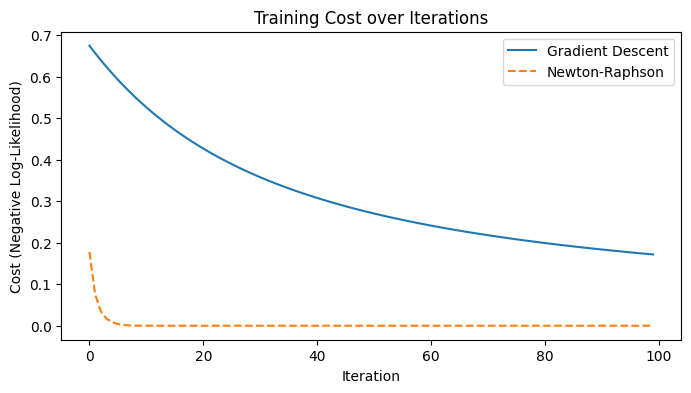

In [ ]:
# Generate toy data
X_raw, y = generate_toy_data(N=200)  # 100 samples per class
# Add intercept
X = add_intercept(X_raw)

# 1) Solve with Gradient Descent
beta_gd, cost_hist_gd = logistic_regression_gd(X, y, lr=0.01, num_iter=100)

# 2) Solve with Newton-Raphson
beta_newton, cost_hist_newton = logistic_regression_newton(X, y, num_iter=100)

plt.figure(figsize=(8, 4))
plt.plot(cost_hist_gd, label="Gradient Descent")
plt.plot(cost_hist_newton, label="Newton-Raphson", linestyle='--')
plt.xlabel("Iteration")
# plt.xlim(0, 10)
plt.ylabel("Cost (Negative Log-Likelihood)")
plt.title("Training Cost over Iterations")
plt.legend()
plt.show()

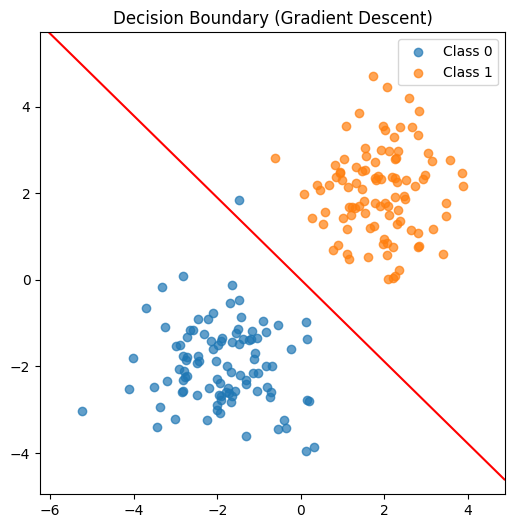

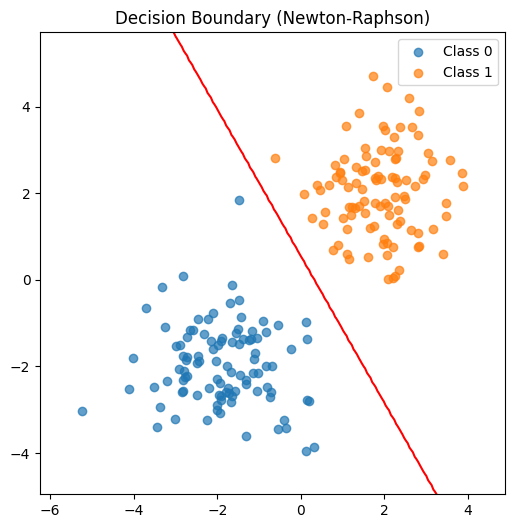

Metrics for Gradient Descent solution:
Accuracy:  0.9950
Precision: 0.9901
Recall:    1.0000
F1-Score:  0.9950

Metrics for Newton-Raphson solution:
Accuracy:  1.0000
Precision: 1.0000
Recall:    1.0000
F1-Score:  1.0000


In [ ]:
def plot_decision_boundary(X_raw, y, beta, title=""):
    """
    X_raw: shape (N, 2) original 2D data
    y: shape (N,)
    beta: shape (3,) with intercept
    """
    # Plot data
    plt.figure(figsize=(6, 6))
    plt.scatter(X_raw[y==0, 0], X_raw[y==0, 1], label="Class 0", alpha=0.7)
    plt.scatter(X_raw[y==1, 0], X_raw[y==1, 1], label="Class 1", alpha=0.7)

    # Create a grid to evaluate model
    x_min, x_max = X_raw[:, 0].min()-1, X_raw[:, 0].max()+1
    y_min, y_max = X_raw[:, 1].min()-1, X_raw[:, 1].max()+1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                         np.linspace(y_min, y_max, 100))

    # Construct Xgrid for prediction, adding intercept
    Xgrid = np.c_[np.ones((xx.size, 1)), xx.ravel(), yy.ravel()]
    # Probability
    zz = sigmoid(Xgrid @ beta).reshape(xx.shape)

    # Decision boundary is where p=0.5
    plt.contour(xx, yy, zz, levels=[0.5], colors='red')

    plt.title(title)
    plt.legend()
    plt.show()

# Plot results
plot_decision_boundary(X_raw, y, beta_gd, title="Decision Boundary (Gradient Descent)")
plot_decision_boundary(X_raw, y, beta_newton, title="Decision Boundary (Newton-Raphson)")

def evaluate_model(X, y, beta):
    """
    Predict labels and compute metrics.
    """
    # Predictions
    probs = sigmoid(X @ beta)
    # Convert to 0/1 using a threshold of 0.5
    y_pred = (probs >= 0.5).astype(int)

    acc = accuracy_score(y, y_pred)
    prec = precision_score(y, y_pred)
    rec = recall_score(y, y_pred)
    f1 = f1_score(y, y_pred)

    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1-Score:  {f1:.4f}")

print("Metrics for Gradient Descent solution:")
evaluate_model(X, y, beta_gd)
print("\nMetrics for Newton-Raphson solution:")
evaluate_model(X, y, beta_newton)

Perfect predictions of NR is becuase of the data - it's a small and clean dataset with perfectly separable (not overlapping) classes.

---

## Task 3: Classification for Imbalanced Data

Split the data using a technique suitable for imbalanced classes. Describe its working.

Train a logistic regression model on the below data.

Evaluate your binary classifiers using the following:
- confusion matrix,
- accuracy,
- precision,
- recall,
- F1 score,
- ROCAUC.

Please write custom functions calculating the above functions and plotting the receiver operating characteristic curve. Describe your intuition behind each metric and its suitability for imbalanced classes.

Propose, describe and implement a technique for improving the model's ability to distinguish the classes. Evaluate your approach.

### Task 3 - Solution

Dataset Shape: (1000, 20)
Class Distribution: [944  56]


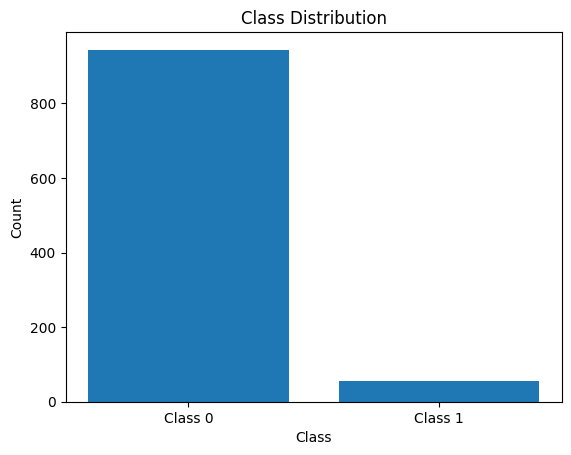

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc

# 1. Data Generation
# -------------------------------------------------------------------

# Create a synthetic dataset
X, y = make_classification(
    n_samples=1000,
    n_informative=4, n_redundant=5, n_features=20, n_clusters_per_class=3,
    n_classes=2,
    weights=[0.95, 0.05],
    random_state=42
)

# Visualize class distribution
def visualize_class_distribution(y):
    plt.bar(['Class 0', 'Class 1'], [sum(y == 0), sum(y == 1)])
    plt.title("Class Distribution")
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.show()

# Summarize dataset
print("Dataset Shape:", X.shape)
print("Class Distribution:", np.bincount(y))
visualize_class_distribution(y)

**Data Splitting Technique:**  
- **Stratified Shuffle Split:** Ensures the train-test split maintains the same class proportions as the original dataset, which is crucial for imbalanced datasets to prevent biased training or evaluation.  

Training set shape: (800, 20)
Training class distribution: [755  45]


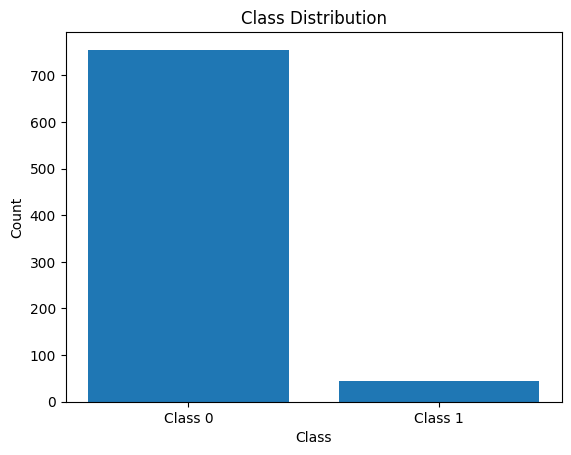

Test set shape: (200, 20)
Test class distribution: [189  11]


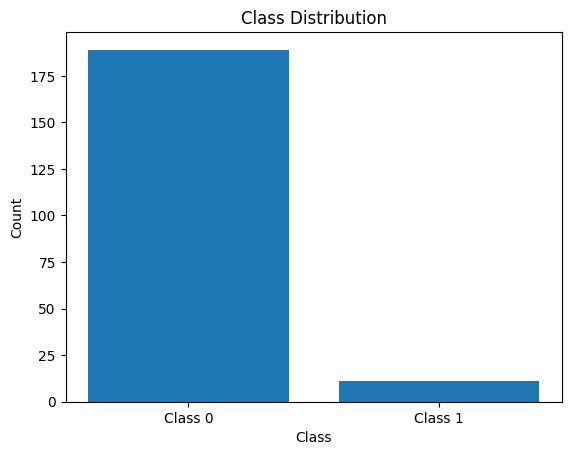

In [ ]:
# 2. Stratified Train-Test Split
# -------------------------------------------------------------------
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in splitter.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

print("Training set shape:", X_train.shape)
print("Training class distribution:", np.bincount(y_train))
visualize_class_distribution(y_train)

print("Test set shape:", X_test.shape)
print("Test class distribution:", np.bincount(y_test))
visualize_class_distribution(y_test)

**Metrics:**  
- **Confusion Matrix:** Counts true/false positives and negatives. Suitable for imbalanced data as it shows detailed errors.  
- **Accuracy:** Proportion of correct predictions but may mislead for imbalanced data if most predictions are for the majority class.  
- **Precision:** Focuses on how many predicted positives are true positives - important when false positives are costly.  
- **Recall:** Measures how many actual positives are captured - useful for imbalanced data where missing positives is critical.  
- **F1 Score:** Harmonic mean of precision and recall - balances the trade-off between them.  
- **ROC AUC:** Measures how well the model distinguishes between classes by plotting the true positive rate (TPR) against the false positive rate (FPR), works well for imalanced data.

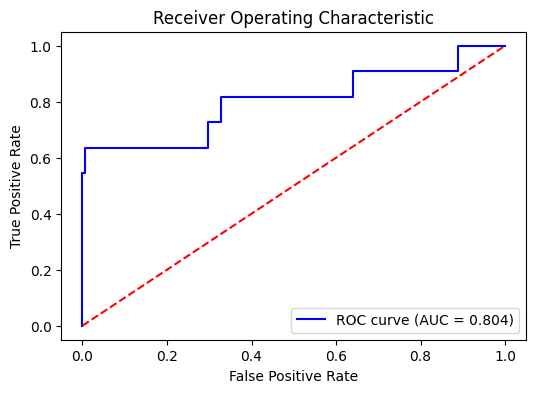

=== Baseline Model Results ===
Confusion Matrix -> TP: 5, FP: 0, FN: 6, TN: 189
Accuracy  : 0.970
Precision : 1.000
Recall    : 0.455
F1 Score  : 0.625
ROC AUC   : 0.804


In [ ]:
# 3. Logistic Regression Model
# -------------------------------------------------------------------
model = LogisticRegression(solver='liblinear', random_state=42)
model.fit(X_train, y_train)

# 4. Custom Evaluation Metrics
# -------------------------------------------------------------------
def compute_confusion_matrix(y_true, y_pred):
    """
    Returns the confusion matrix as (TP, FP, FN, TN)
    """
    TP = np.sum((y_true == 1) & (y_pred == 1))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    return TP, FP, FN, TN

def accuracy_score(y_true, y_pred):
    """
    Out of all predictions, how many were correct?
    """
    TP, FP, FN, TN = compute_confusion_matrix(y_true, y_pred)
    return (TP + TN) / (TP + FP + FN + TN)

def precision_score(y_true, y_pred):
    """
    Out of all positive predictions, how many were correct?
    """
    TP, FP, FN, TN = compute_confusion_matrix(y_true, y_pred)
    if TP + FP == 0:
        return 0
    return TP / (TP + FP)

def recall_score(y_true, y_pred):
    """
    Out of all actual positive cases, how many were predicted positive?
    """
    TP, FP, FN, TN = compute_confusion_matrix(y_true, y_pred)
    if TP + FN == 0:
        return 0
    return TP / (TP + FN)

def f1_score(y_true, y_pred):
    """
    Harmonic mean of precision and recall.
    """
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    if (prec + rec) == 0:
        return 0
    return 2 * (prec * rec) / (prec + rec)

def calculate_roc_auc(y_true, y_prob):
    """
    Calculates the ROC curve and AUC.
    """
    # Sort probabilities and corresponding true labels
    sorted_indices = np.argsort(y_prob)[::-1]
    y_true = y_true[sorted_indices]
    y_prob = y_prob[sorted_indices]

    # Initialize variables
    tpr = [0]
    fpr = [0]
    n_pos = sum(y_true)
    n_neg = len(y_true) - n_pos
    tp = 0
    fp = 0

    # Calculate TPR and FPR for each threshold
    for i in range(len(y_true)):
        if y_true[i] == 1:
            tp += 1
        else:
            fp += 1

        tpr.append(tp / n_pos)
        fpr.append(fp / n_neg)

    # Calculate AUC using the trapezoidal rule
    auc = 0.0
    for i in range(1, len(tpr)):
        auc += (fpr[i] - fpr[i - 1]) * (tpr[i] + tpr[i - 1]) / 2

    # Plot the ROC curve
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, color='blue', label='ROC curve (AUC = %0.3f)' % auc)
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return auc


# 5. Evaluate Model on Test Set
# -------------------------------------------------------------------
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]  # Probability of class 1

TP, FP, FN, TN = compute_confusion_matrix(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = calculate_roc_auc(y_test, y_prob)

print("=== Baseline Model Results ===")
print(f"Confusion Matrix -> TP: {TP}, FP: {FP}, FN: {FN}, TN: {TN}")
print(f"Accuracy  : {acc:.3f}")
print(f"Precision : {prec:.3f}")
print(f"Recall    : {rec:.3f}")
print(f"F1 Score  : {f1:.3f}")
print(f"ROC AUC   : {roc_auc:.3f}")

**SMOTE Technique and Results:**  
- **SMOTE (Synthetic Minority Over-sampling Technique):** Creates synthetic samples of the minority class to balance the dataset and improve recall.  
- **Why Precision and ROC AUC Dropped:**  
  - **Precision Lowered:** Synthetic samples increase minority class size, potentially leading to more false positives.  
  - **ROC AUC Smaller:** The model may misclassify more due to overlapping synthetic data points, reducing separability between classes.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


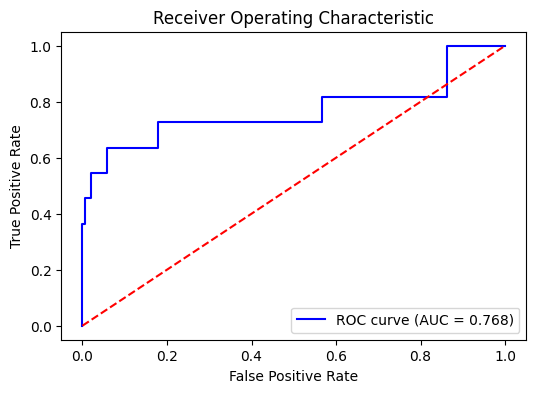


=== Model with Oversampling (SMOTE) ===
Confusion Matrix -> TP: 8, FP: 52, FN: 3, TN: 137
Accuracy  : 0.725
Precision : 0.133
Recall    : 0.727
F1 Score  : 0.225
ROC AUC   : 0.768


In [ ]:
from imblearn.over_sampling import SMOTE

# Resample the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Train the model with oversampled data
oversampled_model = LogisticRegression(solver='liblinear', random_state=42)
oversampled_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred_oversampled = oversampled_model.predict(X_test)
y_prob_oversampled = oversampled_model.predict_proba(X_test)[:, 1]

# Compute metrics
TP_o, FP_o, FN_o, TN_o = compute_confusion_matrix(y_test, y_pred_oversampled)
acc_o = accuracy_score(y_test, y_pred_oversampled)
prec_o = precision_score(y_test, y_pred_oversampled)
rec_o = recall_score(y_test, y_pred_oversampled)
f1_o = f1_score(y_test, y_pred_oversampled)
roc_auc_o = calculate_roc_auc(y_test, y_prob_oversampled)

# Display results
print("\n=== Model with Oversampling (SMOTE) ===")
print(f"Confusion Matrix -> TP: {TP_o}, FP: {FP_o}, FN: {FN_o}, TN: {TN_o}")
print(f"Accuracy  : {acc_o:.3f}")
print(f"Precision : {prec_o:.3f}")
print(f"Recall    : {rec_o:.3f}")
print(f"F1 Score  : {f1_o:.3f}")
print(f"ROC AUC   : {roc_auc_o:.3f}")

---
## Task 4

The **backpropagation algorithm** is the foundational algorithm in deep learning. In this task You will have to go through a single iteration of said algorithm and compare the results after updating networks weights. <br>
You are given a neural network with one input layer consisting of two input nodes ${n_1, n_2}$, one hidden layer with two neurons ${n_3, n_4}$ and an output layer with a single node $n_5$. We will denote the weight connecting $n_i$ to $n_j$ as $w_{i,j}$. A bias related to $n_i$ will be denoted as $b_i$. Parameters are initialized as follows:
* $w_{1,3} = 1.5$ ; $w_{2,3} = -2.5$ ; $b_{3} = 0.3$
* $w_{1,4} = 1$ ; $w_{2,4} = -2.5$ ; $b_{4} = 0.2$
* $w_{3,5} = 4$ ; $w_{4,5} = 3$ ; $b_{5} = -0.8$ <br>

Additionally, neurons $n_3$ and $n_4$ are equipped with the sigmoid activation function: $\sigma(x) = \frac{1}{1+e^{-x}} $<br>
Your task is to use two training examples: $x = \{ (1,2), (2,0)\}$, $y = \{-1, 6\}$ to preform a single backpropagation step - preform forward calculations and propagate the received error backwards, updating the weights. After all weights have been updated, check how the predictions change, preforming additional forward pass.

### Task 4 - Solution

In [ ]:
import numpy as np

#---------------------------
# 1. Initialization
#---------------------------
# Training examples: (x1, x2) -> target y
X = np.array([[1, 2],
              [2, 0]], dtype=float)
y = np.array([[-1],
              [ 6]], dtype=float)

# Weights and biases as given
w13 = 1.5
w23 = -2.5
b3  = 0.3

w14 = 1.0
w24 = -2.5
b4  = 0.2

w35 = 4.0
w45 = 3.0
b5  = -0.8

# Learning rate
alpha = 0.1

def sigmoid(z):
    return 1.0 / (1.0 + np.exp(-z))

#---------------------------
# 2. Forward pass function
#---------------------------
def forward_pass(x1, x2):
    # Hidden neuron n3
    z3 = w13*x1 + w23*x2 + b3
    a3 = sigmoid(z3)
    # Hidden neuron n4
    z4 = w14*x1 + w24*x2 + b4
    a4 = sigmoid(z4)
    # Output neuron n5 (linear)
    z5 = w35*a3 + w45*a4 + b5
    return a3, a4, z5

#---------------------------
# 3. Compute predictions before update
#---------------------------
preds_before = []
for i in range(X.shape[0]):
    x1, x2 = X[i]
    _, _, z5 = forward_pass(x1, x2)
    preds_before.append(z5)

print("Predictions before update:", preds_before)

#---------------------------
# 4. Backpropagation
#    Compute gradients for each weight/bias
#---------------------------
# We will accumulate partial derivatives over the 2 data points

d_w13 = 0.0
d_w23 = 0.0
d_b3  = 0.0

d_w14 = 0.0
d_w24 = 0.0
d_b4  = 0.0

d_w35 = 0.0
d_w45 = 0.0
d_b5  = 0.0

for i in range(X.shape[0]):
    x1, x2 = X[i]
    t = y[i]  # target
    # Forward pass for i-th example
    a3, a4, y_hat = forward_pass(x1, x2)

    # MSE derivative w.r.t. z5
    # delta_5 = (y_hat - t) * derivative of output activation
    # But output activation is identity -> derivative is 1
    delta_5 = (y_hat - t)

    # Gradients w.r.t. w35, w45, b5
    d_w35 += delta_5 * a3
    d_w45 += delta_5 * a4
    d_b5  += delta_5

    # The hidden layer
    delta_3 = delta_5 * w35 * a3*(1 - a3)
    delta_4 = delta_5 * w45 * a4*(1 - a4)

    # Gradients w.r.t. w13, w23, b3
    d_w13 += delta_3 * x1
    d_w23 += delta_3 * x2
    d_b3  += delta_3

    # Gradients w.r.t. w14, w24, b4
    d_w14 += delta_4 * x1
    d_w24 += delta_4 * x2
    d_b4  += delta_4

# Because we have 2 examples, we can average the gradients
d_w13 /= 2.0
d_w23 /= 2.0
d_b3  /= 2.0
d_w14 /= 2.0
d_w24 /= 2.0
d_b4  /= 2.0
d_w35 /= 2.0
d_w45 /= 2.0
d_b5  /= 2.0

#---------------------------
# 5. Gradient Descent Update
#---------------------------
w13 -= alpha * d_w13
w23 -= alpha * d_w23
b3  -= alpha * d_b3

w14 -= alpha * d_w14
w24 -= alpha * d_w24
b4  -= alpha * d_b4

w35 -= alpha * d_w35
w45 -= alpha * d_w45
b5  -= alpha * d_b5

#---------------------------
# 6. New predictions after update
#---------------------------
preds_after = []
for i in range(X.shape[0]):
    x1, x2 = X[i]
    _, _, z5 = forward_pass(x1, x2)
    preds_after.append(z5.item())

print("Predictions after update:", preds_after)
print("Difference: ", [a - b for a, b in zip(preds_after, preds_before)])

Predictions before update: [-0.5776932960045512, 5.758463775550401]
Predictions after update: [-0.5880896468036103, 5.772342403928815]
Difference:  [-0.010396350799059095, 0.013878628378414248]


---
## Task 5: L1 & L2 Regularization for Logistic Regression

In this task we will use a synthetic dataset generated by the function `make_classification`.

1. Use a pairplot to see the relationships between the features in the dataset.
2. Apply your logistic regression model from Task 1 on this dataset and measure its accuracy.
3. Modify your implementation to account for two regularization methods: L1 and L2 and apply them to the dataset. What can you observe?
4. Which features are selected by L1 regularization? Plot the decision boundary for these features.

(If you have not done Task 1, use `LogisticRegression` from `sklearn` to see the effects of regularization. You can get half of the points for this task if you do that.)

### Task 5 - Solution

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Generate data using make_classification
X, y = make_classification(
    n_samples=1000,
    n_features=20,
    n_informative=5,
    n_redundant=5,
    n_classes=2,
    random_state=42
)

# Create a Pandas DataFrame
feature_names = [f"Feature_{i}" for i in range(1, 21)]
dataset = pd.DataFrame(X, columns=feature_names)
dataset["Target"] = y

print("Dataset shape:", dataset.shape)
dataset.head()

Dataset shape: (1000, 21)


,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,...,Feature_12,Feature_13,Feature_14,Feature_15,Feature_16,Feature_17,Feature_18,Feature_19,Feature_20,Target
0,-1.670268,0.225171,-0.051395,-0.520209,-0.583561,-1.322774,0.627702,-1.983762,5.345059,-1.219417,...,2.961265,0.596300,2.007573,2.367967,2.213647,2.044939,-0.665107,-0.875058,-0.291021,1
1,0.891603,-0.499202,1.366215,0.783466,1.236490,-0.816878,0.280928,-0.718484,-0.021931,1.199322,...,0.655303,0.316274,1.989764,-0.012088,-0.523177,1.870139,1.094562,-0.978686,0.808989,0
2,0.103444,-0.216732,-0.495215,0.124385,1.985676,0.735769,-0.304345,-0.259222,1.291528,1.331789,...,0.363854,-1.976822,1.527809,0.863273,1.159926,0.123529,0.618556,-1.693740,-0.312929,1
3,-0.331315,0.329823,-0.033068,0.163428,1.604735,-2.706819,0.220842,-0.061776,1.004155,0.082747,...,1.626956,1.323341,1.970248,-0.266431,-1.418478,0.491004,-2.946904,-0.604178,-0.042824,0
4,-0.563841,1.021623,0.745151,2.082660,-0.384457,0.217004,0.134166,-0.378760,1.366999,0.319787,...,1.221082,-2.384307,0.283424,1.324575,1.375207,-0.411025,-0.711462,0.334629,0.428342,0


- We use make_classification to create a synthetic dataset with 1000 samples, 20 features, and 2 classes.
- `n_informative=5` and `n_redundant=5` means 5 features are genuinely helpful for prediction, and 5 are linear combinations of other features. The remaining 10 features are basically noise.

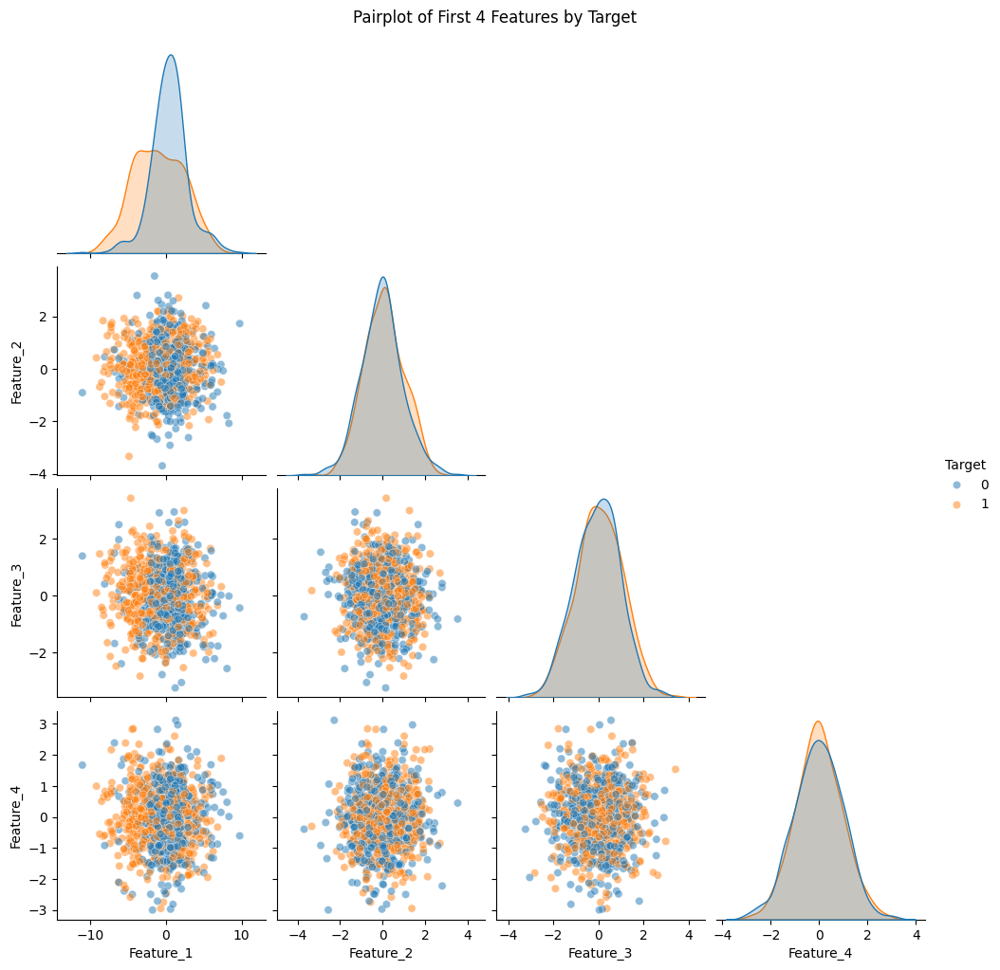

In [ ]:
# We'll only visualize a subset of features at first
sns.pairplot(dataset, vars=feature_names[:4], hue="Target", diag_kind='kde', corner=True, plot_kws={'alpha': 0.5})
plt.suptitle("Pairplot of First 4 Features by Target", y=1.02)
plt.show()

- There is no clear separation between the first 4 sets.

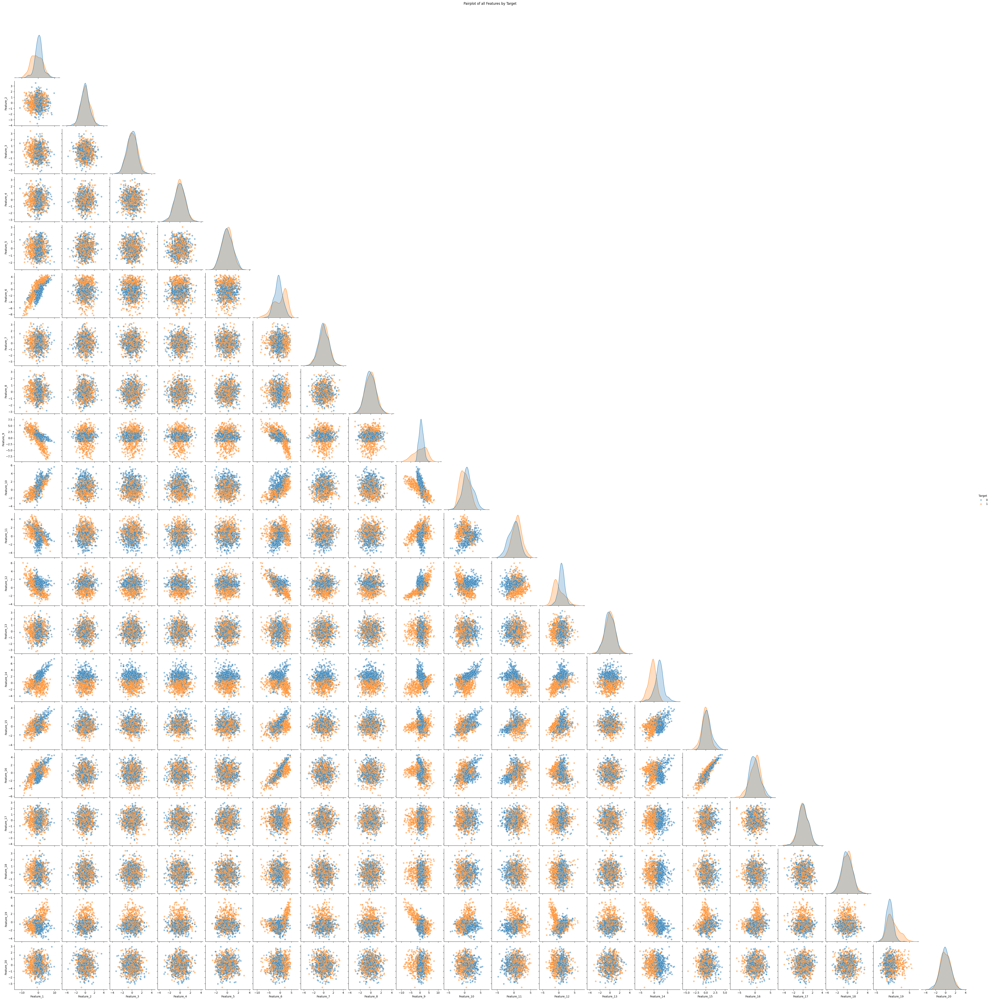

In [ ]:
sns.pairplot(dataset, vars=feature_names, hue="Target", diag_kind='kde', corner=True, plot_kws={'alpha': 0.5})
plt.suptitle("Pairplot of all Features by Target", y=1.02)
plt.show()

In [ ]:
train_df, test_df = train_test_split(
    dataset, test_size=0.3, random_state=42, stratify=dataset["Target"]
)

X_train = train_df[feature_names].values
y_train = train_df["Target"].values
X_test = test_df[feature_names].values
y_test = test_df["Target"].values

print("Train set:", X_train.shape, "Test set:", X_test.shape)

Train set: (700, 20) Test set: (300, 20)


In [ ]:
def add_intercept(X):
    """
    Adds a column of 1's to X for the intercept term.
    """
    N = X.shape[0]
    intercept = np.ones((N, 1))
    return np.hstack((intercept, X))  # shape: (N, K+1)

def sigmoid(z):
    """
    The sigmoid function: S(z) = 1 / (1 + exp(-z)).
    """
    return 1.0 / (1.0 + np.exp(-z))

def cost_function_noreg(beta, X, y):
    """
    Computes the negative log-likelihood for logistic regression.
    beta: shape (K,)
    X: shape (N, K)
    y: shape (N,)
    """
    # Compute p = simgoid(X beta)
    z = X @ beta
    p = sigmoid(z)

    # Add a small epsilon to avoid log(0)
    eps = 1e-9
    cost = -np.mean( y * np.log(p + eps) + (1 - y) * np.log(1 - p + eps) )
    return cost

def gradient_noreg(beta, X, y):
    """
    Computes gradient of negative log-likelihood w.r.t. beta.
    """
    # Compute p = simgoid(X beta)
    z = X @ beta
    p = sigmoid(z)

    # Residual: p - y
    grad = X.T @ (p - y) / X.shape[0]  # Divide by N for mean
    return grad

In [ ]:
def cost_function_l2(beta, X, y, lambda_):
    """
    Cost = negative log-likelihood + lambda_ * sum(beta^2)
    """
    # Standard negative log-likelihood
    cost_nll = cost_function_noreg(beta, X, y)

    # L2 term
    reg_term = lambda_ * np.sum(beta[1:] ** 2)
    return cost_nll + reg_term

def gradient_l2(beta, X, y, lambda_):
    """
    Gradient of NLL + lambda_ * beta
    """
    grad_noll = gradient_noreg(beta, X, y)
    grad_reg = lambda_ * beta
    return grad_noll + grad_reg

def cost_function_l1(beta, X, y, lambda_):
    """
    Cost = negative log-likelihood + lambda_ * sum(|beta|)
    """
    cost_nll = cost_function_noreg(beta, X, y)
    reg_term = lambda_ * np.sum(np.abs(beta[1:]))
    return cost_nll + reg_term

def gradient_l1(beta, X, y, lambda_):
    """
    Gradient of NLL + lambda_ * sign(beta).
    sign(0) is undefined, but we can set sign(0) = 0 for simplicity.
    """
    grad_noll = gradient_noreg(beta, X, y)
    # sign function
    sign_beta = np.sign(beta)
    # If exactly zero, let's keep sign as 0
    sign_beta[beta == 0] = 0.0

    grad_reg = lambda_ * sign_beta
    grad_reg[beta == 0] = 0
    return grad_noll + grad_reg

In [ ]:
def logistic_regression_gd(
    X, y,
    lr=0.01,
    num_iter=1000,
    tol=1e-6,
    reg_type=None,
    lambda_=0.01
):
    """
    General logistic regression with gradient descent.
    X: (N, K) -> data with intercept column
    y: (N,)
    lr: learning rate
    num_iter: max iterations
    tol: tolerance for stop
    reg_type: None, 'l2', or 'l1'
    lambda_: regularization strength
    """
    beta = np.zeros(X.shape[1])
    cost_history = []

    for i in range(num_iter):
        if reg_type == "l2":
            cost = cost_function_l2(beta, X, y, lambda_)
            grad = gradient_l2(beta, X, y, lambda_)
        elif reg_type == "l1":
            cost = cost_function_l1(beta, X, y, lambda_)
            grad = gradient_l1(beta, X, y, lambda_)
        else:
            cost = cost_function_noreg(beta, X, y)
            grad = gradient_noreg(beta, X, y)

        beta_new = beta - lr * grad

        # Early stopping
        if np.linalg.norm(beta_new - beta) < tol:
            beta = beta_new
            cost_history.append(cost)
            break

        beta = beta_new
        cost_history.append(cost)

    return beta, cost_history

In [ ]:
def prepare_data_for_custom_lr(X):
    """
    Utility to add intercept column to feature matrix.
    """
    return add_intercept(X)

X_train_custom = prepare_data_for_custom_lr(X_train)
X_test_custom = prepare_data_for_custom_lr(X_test)

print("X_train_custom shape:", X_train_custom.shape)
print("X_test_custom shape :", X_test_custom.shape)

X_train_custom shape: (700, 21)
X_test_custom shape : (300, 21)


Finished training models.


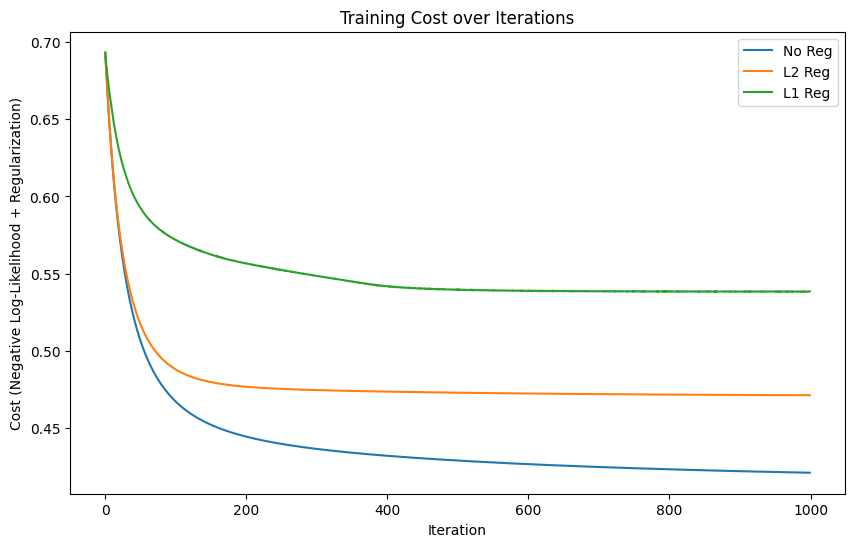

In [ ]:
# No Regularization
beta_noreg, cost_hist_noreg = logistic_regression_gd(
    X_train_custom, y_train,
    lr=0.01, num_iter=1000, tol=1e-6,
    reg_type=None, lambda_=0.0
)

# L2 Regularization
beta_l2, cost_hist_l2 = logistic_regression_gd(
    X_train_custom, y_train,
    lr=0.01, num_iter=1000, tol=1e-6,
    # reg_type='l2', lambda_=0.055
    reg_type='l2', lambda_=0.1
    # reg_type='l2', lambda_=0.3
    # reg_type='l2', lambda_=0.5
)

# L1 Regularization
beta_l1, cost_hist_l1 = logistic_regression_gd(
    X_train_custom, y_train,
    lr=0.01, num_iter=1000, tol=1e-6,
    # reg_type='l1', lambda_=0.055
    reg_type='l1', lambda_=0.1
    # reg_type='l1', lambda_=0.3
    # reg_type='l1', lambda_=0.5
)

print("Finished training models.")

plt.figure(figsize=(10, 6))
plt.plot(cost_hist_noreg, label="No Reg")
plt.plot(cost_hist_l2, label="L2 Reg")
plt.plot(cost_hist_l1, label="L1 Reg")
plt.title("Training Cost over Iterations")
plt.xlabel("Iteration")
plt.ylabel("Cost (Negative Log-Likelihood + Regularization)")
plt.legend()
plt.show()

### Observations:
- No reg - lowest cost, since it doesn't penalize large coefficients and focuses entirely on minimizing classification errors
- L2 reg - higher cost than no reg, since it penalizes large coefficients, reducing overfitting
- L1 reg - highest cost, since it forces some coefficitens to zero, which can oversimplify the model

In [ ]:
def predict_labels(X, beta):
    # Probability
    probs = sigmoid(X @ beta)
    # Convert to 0/1
    return (probs >= 0.5).astype(int)

def evaluate_model(X, y, beta, name=""):
    y_pred = predict_labels(X, beta)
    acc = accuracy_score(y, y_pred)
    prec = precision_score(y, y_pred)
    rec = recall_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall   : {rec:.4f}")
    print(f"F1-Score : {f1:.4f}")

# Evaluate on test set
evaluate_model(X_test_custom, y_test, beta_noreg, name="No Regularization")
evaluate_model(X_test_custom, y_test, beta_l2,     name="L2 Regularization")
evaluate_model(X_test_custom, y_test, beta_l1,     name="L1 Regularization")


=== No Regularization ===
Accuracy : 0.8200
Precision: 0.8288
Recall   : 0.8067
F1-Score : 0.8176

=== L2 Regularization ===
Accuracy : 0.8100
Precision: 0.8207
Recall   : 0.7933
F1-Score : 0.8068

=== L1 Regularization ===
Accuracy : 0.7733
Precision: 0.8475
Recall   : 0.6667
F1-Score : 0.7463


- L2 and L1 - sacrifice some accuracy to avoid overfitting, which could improve generalization to new data. Increasing `lambda` strengthens the effect.
- No reg - fits the data well, but might overfit

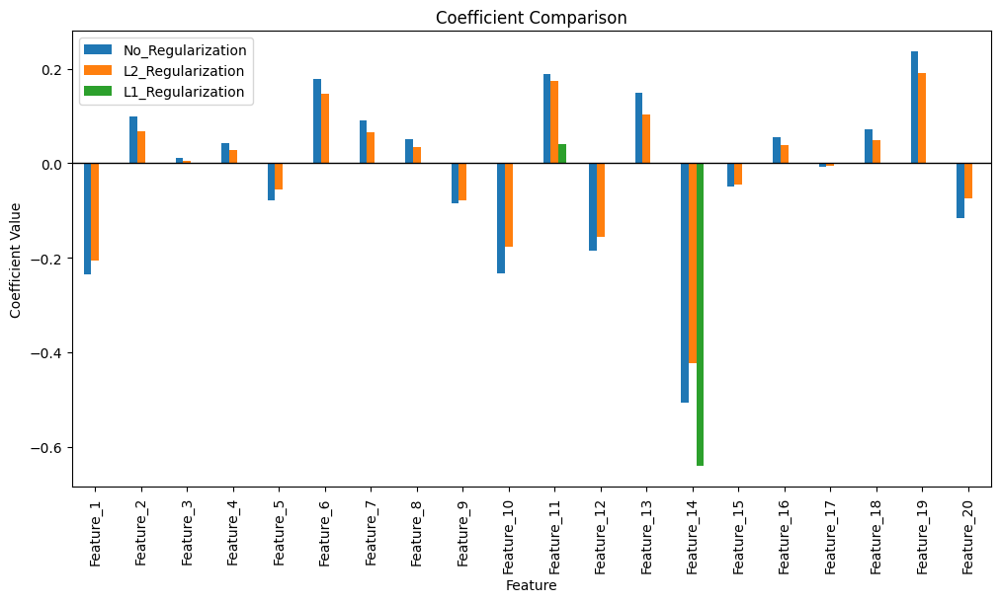

In [ ]:
coef_noreg = beta_noreg[1:]  # skip intercept
coef_l2 = beta_l2[1:]
coef_l1 = beta_l1[1:]

coef_df = pd.DataFrame({
    "Feature": feature_names,
    "No_Regularization": coef_noreg,
    "L2_Regularization": coef_l2,
    "L1_Regularization": coef_l1
}).set_index("Feature")

coef_df.head(10)

coef_df.plot(kind='bar', figsize=(12, 6))
plt.axhline(0, color='black', linewidth=1)
plt.title("Coefficient Comparison")
plt.ylabel("Coefficient Value")
plt.show()

### Observations
- No reg - larger coefficients, might capture noise as well as patterns, leading to overfitting
- L2 - smaller coefficients, reduces the magnitude of weights, but doesn't eliminate any feature entirely
- L1 - More coefficients are very small, close to zero, effectively performing feature selection - might ignore useful information
> If we increased `lambda`, then the coefficients for L2 would be even smaller and more L1 coefficients would be $0$.

In [ ]:
threshold = 1e-2
non_zero_mask = (np.abs(coef_l1) > threshold)
selected_features = [f for f, mask in zip(feature_names, non_zero_mask) if mask]

print("Features selected by L1 (non-zero):")
print(selected_features)

Features selected by L1 (non-zero):
['Feature_11', 'Feature_14']


Top 2 L1 features: ['Feature_14', 'Feature_11']


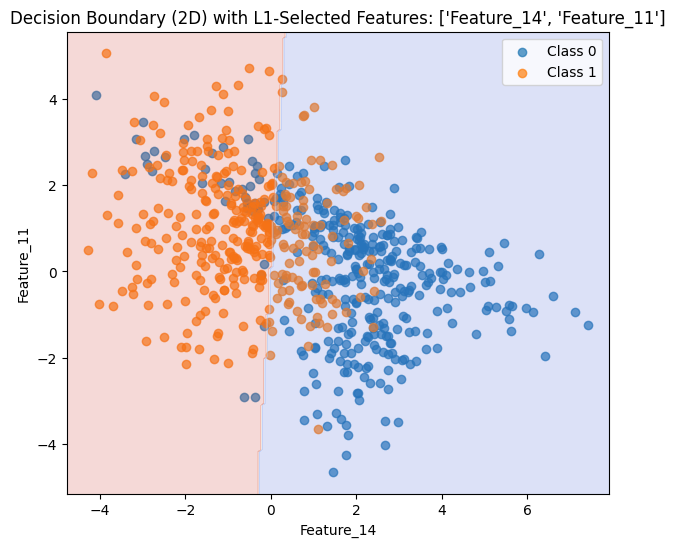

In [ ]:
# Pick top 2 features by absolute coefficient magnitude under L1
abs_coefs = np.abs(coef_l1)
top2_idx = np.argsort(-abs_coefs)[:2]  # indexes of top 2 largest values
top2_features = [feature_names[i] for i in top2_idx]
print("Top 2 L1 features:", top2_features)

# Subset data
X_train_2feat = train_df[top2_features].values
X_test_2feat  = test_df[top2_features].values

# Add intercept
X_train_2feat_custom = add_intercept(X_train_2feat)
X_test_2feat_custom  = add_intercept(X_test_2feat)

# Re-train logistic regression with L1 on only these 2 features
beta_l1_2D, cost_l1_2D = logistic_regression_gd(
    X_train_2feat_custom, y_train,
    lr=0.01, num_iter=1000, tol=1e-6,
    reg_type='l1', lambda_=0.1
)

def plot_2D_decision_boundary(X, y, beta, feat_names):
    """
    X has shape (N, 2) withour intercept column.
    We assume 'beta' has shape (3,) including the intercept.
    """
    plt.figure(figsize=(7, 6))

    # Plot data points for each class
    plt.scatter(X[y == 0, 0], X[y == 0, 1], label="Class 0", alpha=0.7)
    plt.scatter(X[y == 1, 0], X[y == 1, 1], label="Class 1", alpha=0.7)

    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    grid = np.c_[xx.ravel(), yy.ravel()]
    grid_with_intercept = add_intercept(grid)

    Z = predict_labels(grid_with_intercept, beta).reshape(xx.shape)

    plt.contourf(xx, yy, Z, alpha=0.2, cmap='coolwarm')
    plt.title(f"Decision Boundary (2D) with L1-Selected Features: {feat_names}")
    plt.xlabel(feat_names[0])
    plt.ylabel(feat_names[1])
    plt.legend()
    plt.show()

# Plot the boundary on train data
plot_2D_decision_boundary(X_train_2feat, y_train, beta_l1_2D, top2_features)